In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import pickle
%matplotlib inline

In [2]:
from util import image_process as img_tf
from util import camera as camera

### Create a global output folder

In [3]:
# Create 'output_images' folder if it doesn't exist
out_images_folder = 'output_images'
if not os.path.exists(out_images_folder):
    os.makedirs(out_images_folder)
print('Output folder output_images created to store image processing results!')

Output folder output_images created to store image processing results!


### 1. Calibrate Camera using the Input Calibration data

In [4]:
# Specify the output directory to save image and create one if does not exist
CALIB_IMAGES = "./camera_cal/*.jpg"
CALIB_IMAGE_OUT_DIR = "./output_images/camera_calibration" 
if not os.path.exists(CALIB_IMAGE_OUT_DIR):
    os.makedirs(CALIB_IMAGE_OUT_DIR)

In [5]:
# Prepare object points
nx = 6 # Number of inside corners in x
ny = 9 # Number of inside corners in y
nz = 3 # Number of channels

print('Calibrating Camera...........')
cameraMatrix, distortionCoeffs = camera.calibrate_camera(CALIB_IMAGES, nx, ny, nz, CALIB_IMAGE_OUT_DIR)
print('Calibration Done!')

Calibrating Camera...........
Calibration Done!


### 2. Try required Image Transformation steps

In [6]:
from util import image_process as ip

#### 2.1 Undistort the input Chessboard Images

Undistorting Camera Calibration Images...........


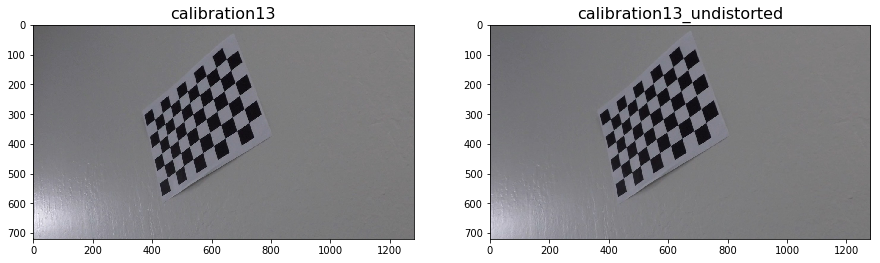

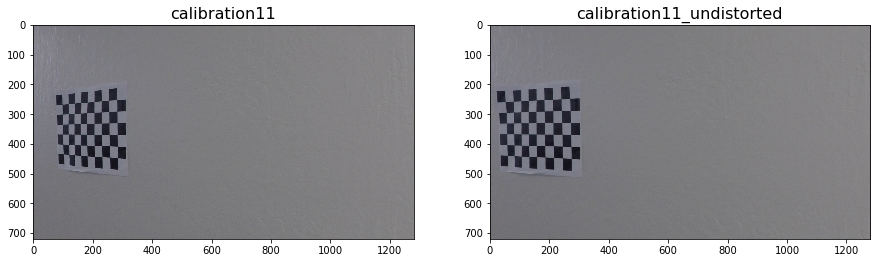

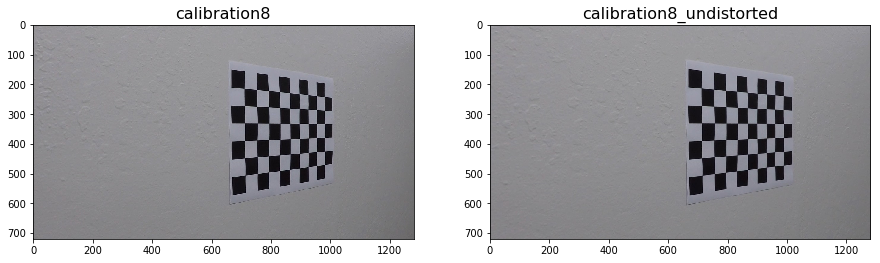

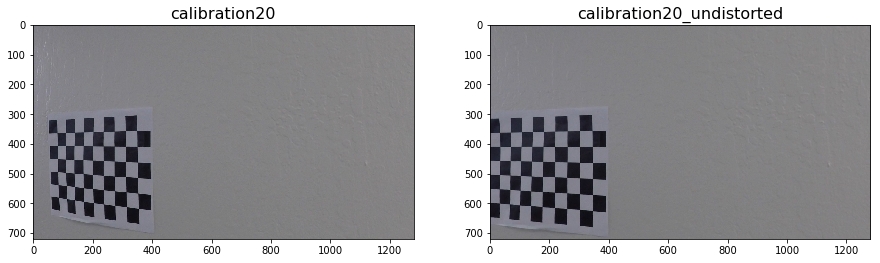

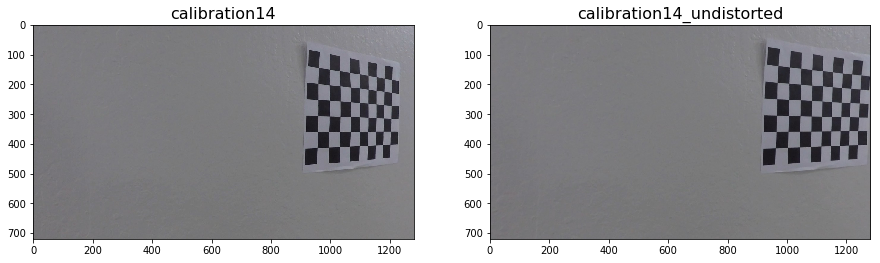

...

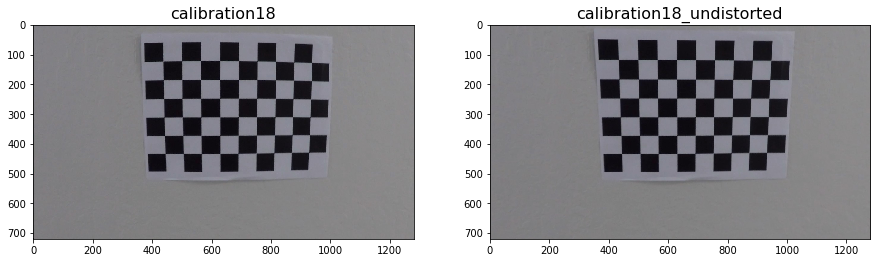

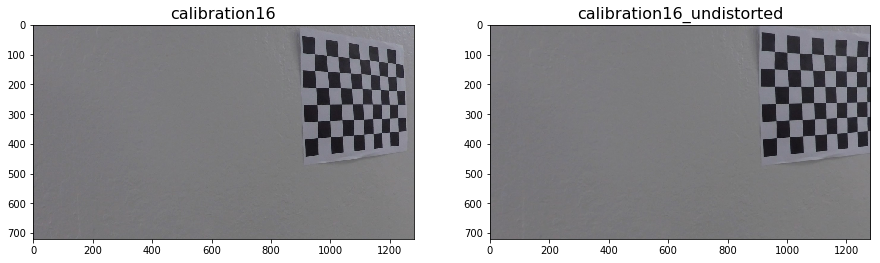

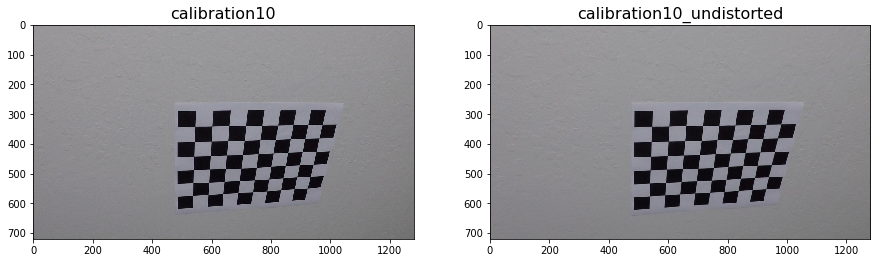

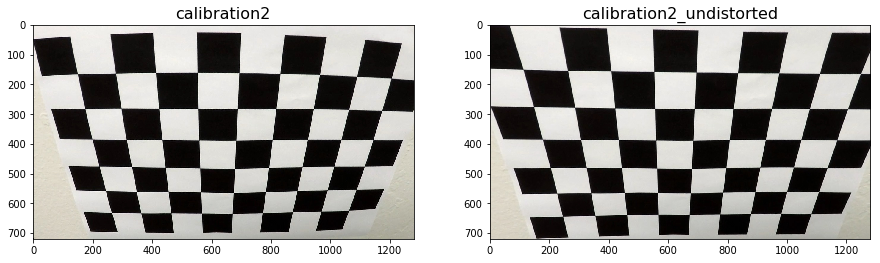

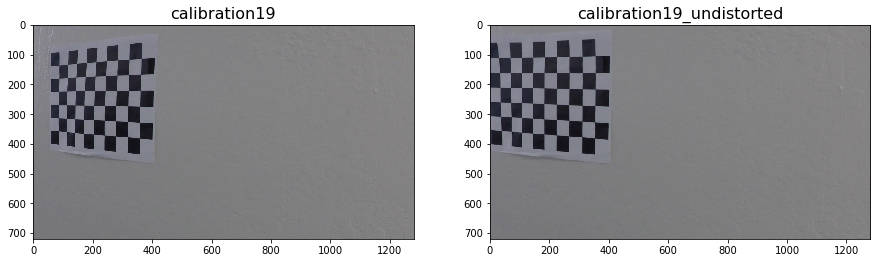

In [7]:
print('Undistorting Camera Calibration Images...........')
# Make a list of calibration images
calib_images = glob.glob(CALIB_IMAGES)
for idx, img in enumerate(calib_images):  
    image_name = img.split('/')[2].split('.')[0]   
    image = mpimg.imread(img)
    undist = ip.undistort(image, cameraMatrix, distortionCoeffs, image_name, CALIB_IMAGE_OUT_DIR)

#### 2.2 Undistort the input Test Road lane Images

In [8]:
test_images = glob.glob('./test_images/*.jpg')
TEST_IMAGE_OUT_DIR = "./output_images/test_images_out" 
if not os.path.exists(TEST_IMAGE_OUT_DIR):
    os.makedirs(TEST_IMAGE_OUT_DIR)

Undistorting Input Images...........


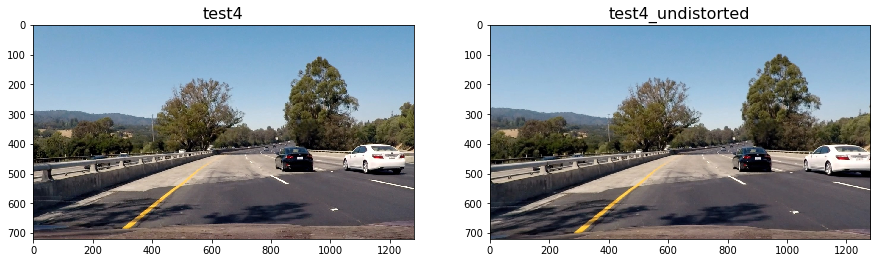

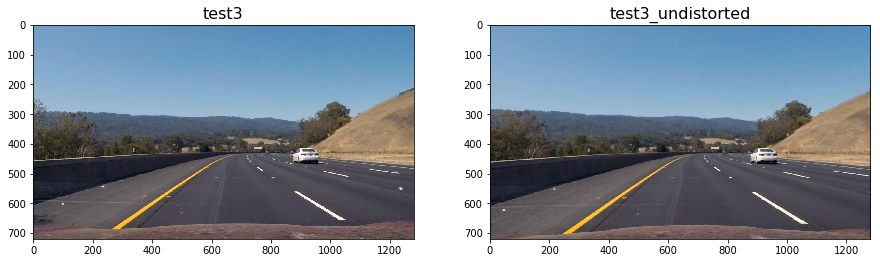

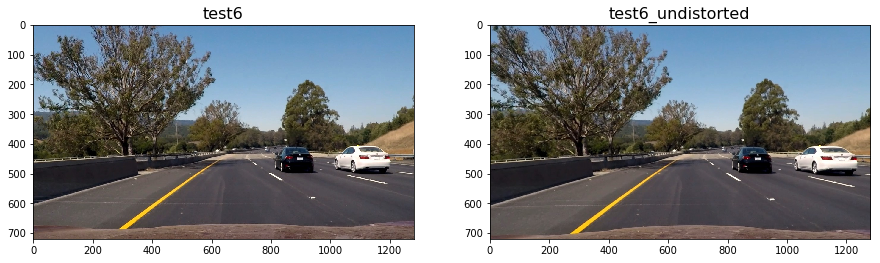

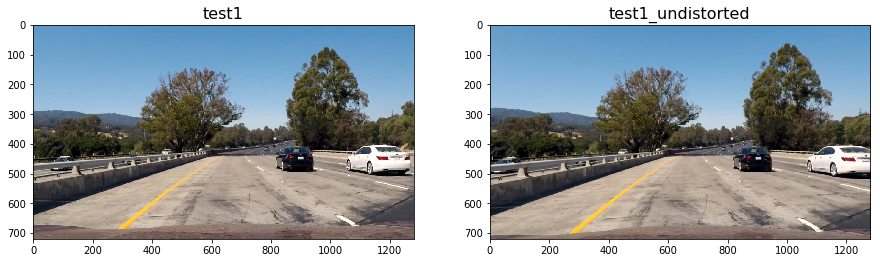

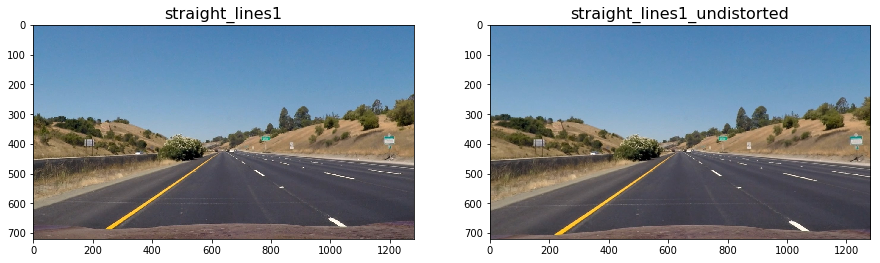

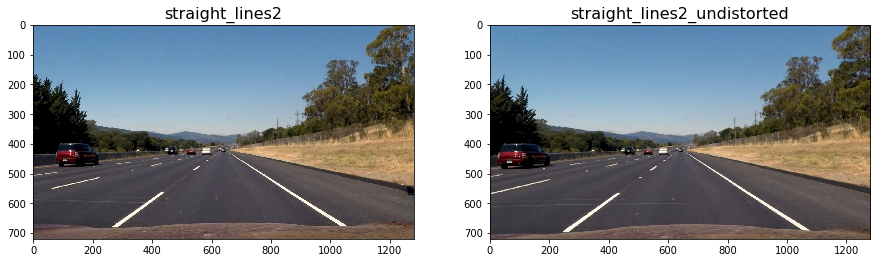

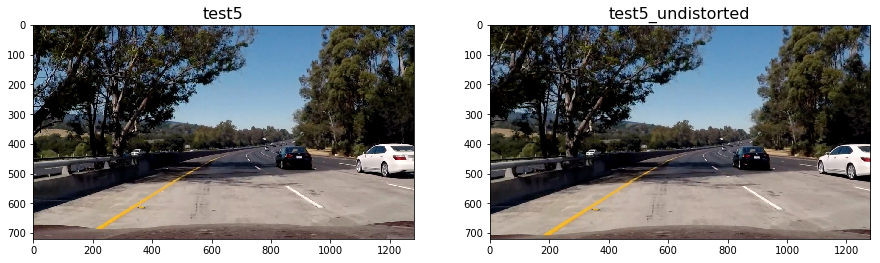

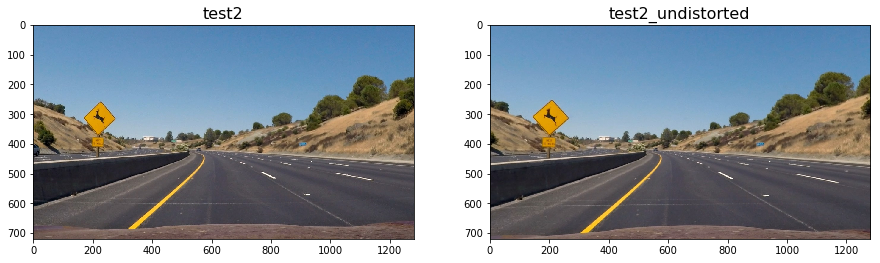

In [9]:
print('Undistorting Input Images...........')
for idx, img in enumerate(test_images):    
    image_name = img.split('/')[2].split('.')[0]  
    out_dir = os.path.join(TEST_IMAGE_OUT_DIR, image_name)
    image = mpimg.imread(img)
    undist = ip.undistort(image, cameraMatrix, distortionCoeffs,  image_name, out_dir)

#### 2.3 Observe different Color Channels

Visualizing Image spaces on Test Images...........
Image: test4
----------------------------------------------------------------


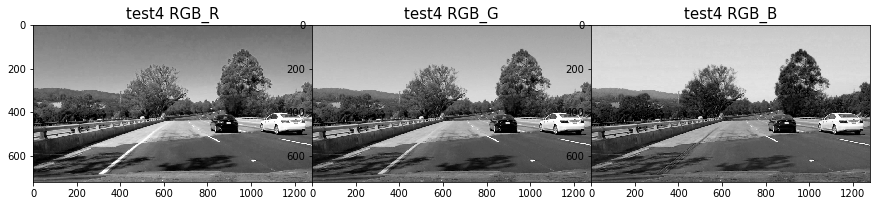

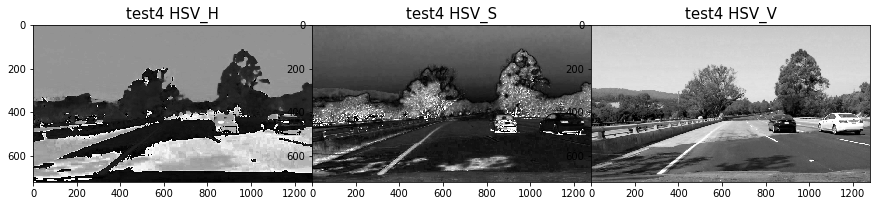

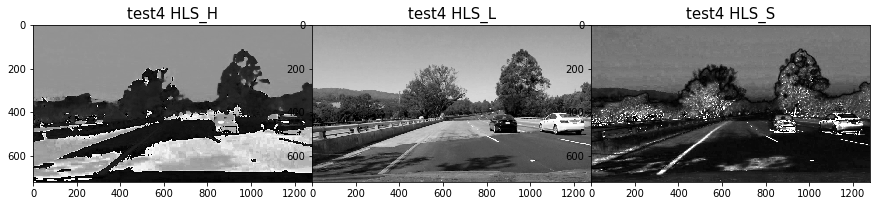

Image: test3
----------------------------------------------------------------


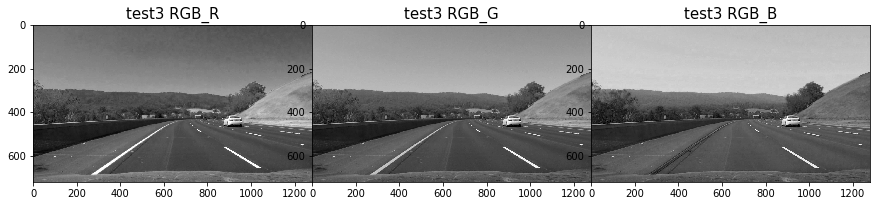

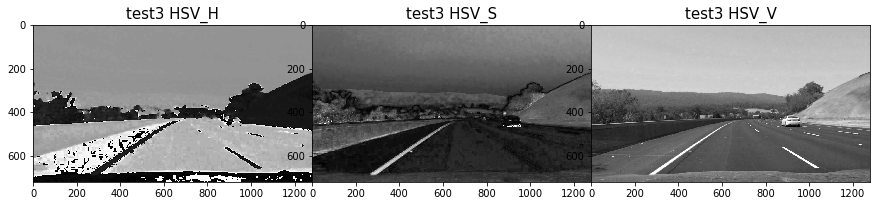

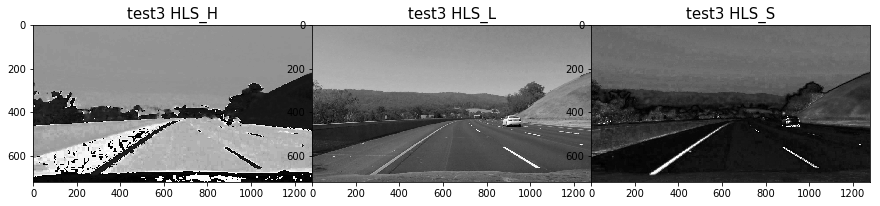

Image: test6
----------------------------------------------------------------


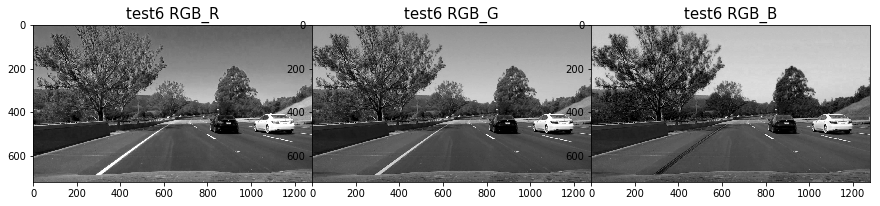

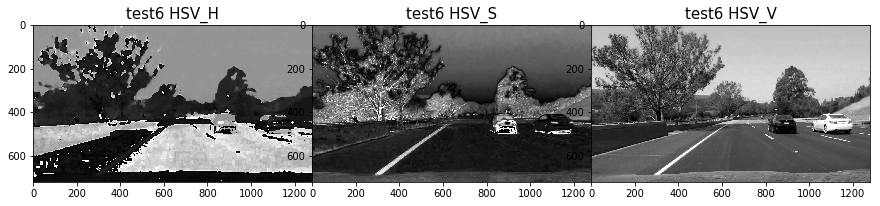

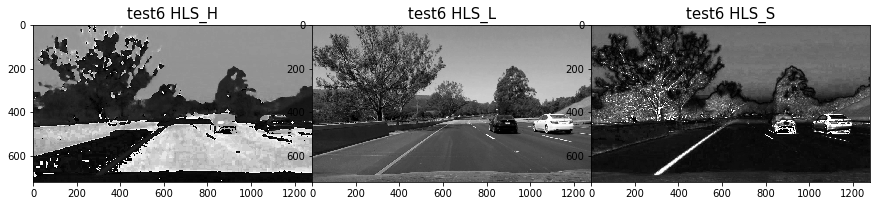

Image: test1
----------------------------------------------------------------


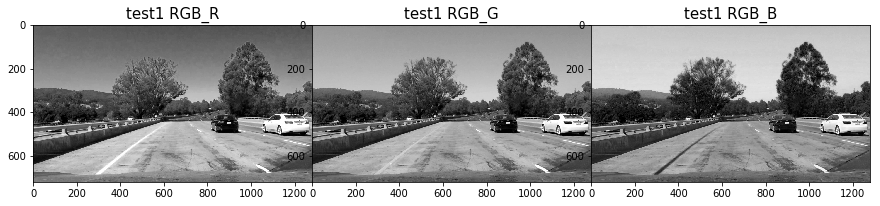

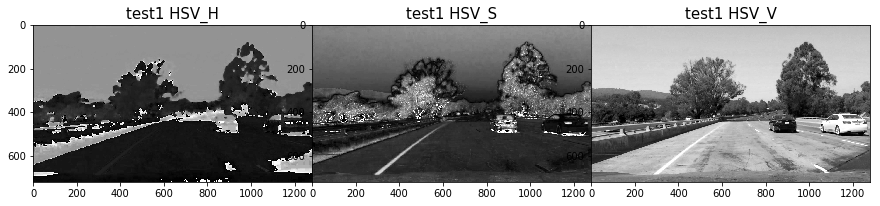

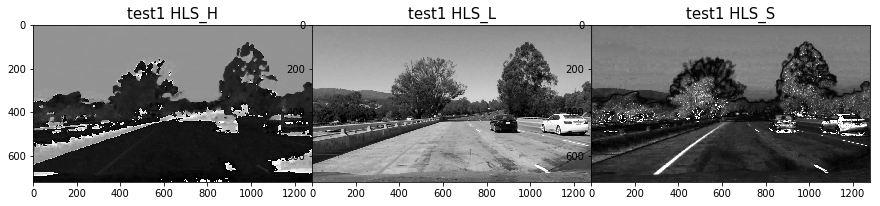

Image: straight_lines1
----------------------------------------------------------------


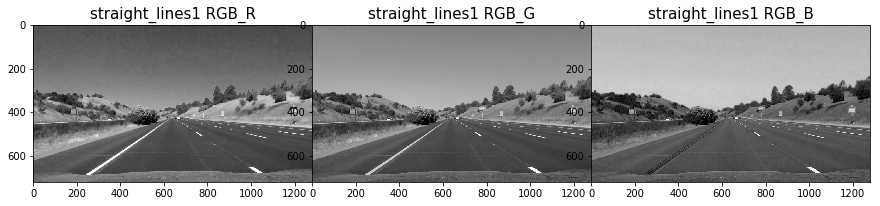

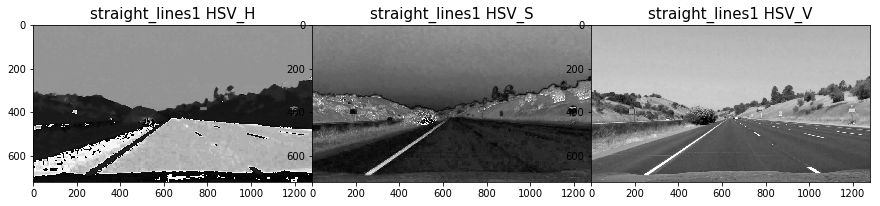

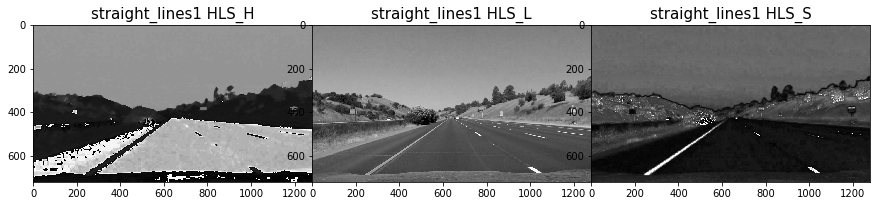

Image: straight_lines2
----------------------------------------------------------------


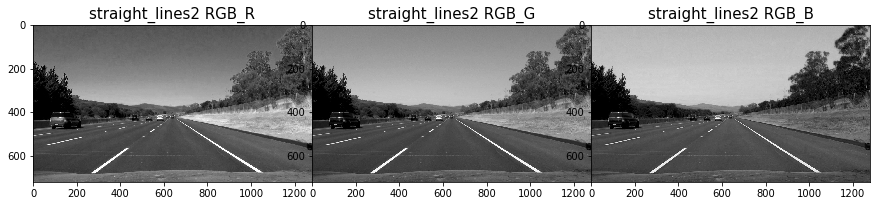

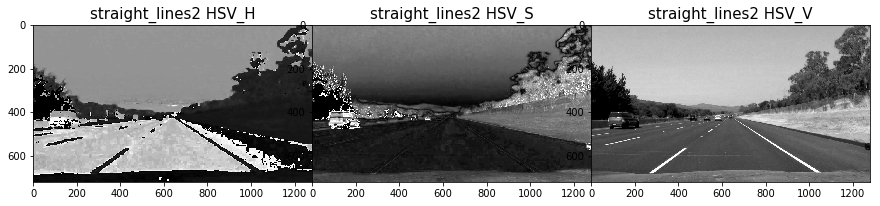

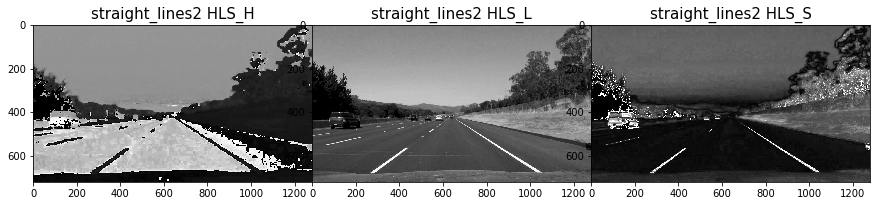

Image: test5
----------------------------------------------------------------


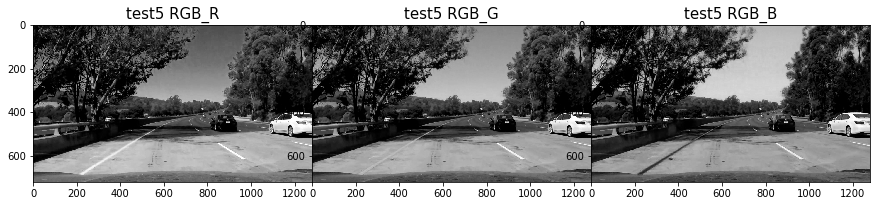

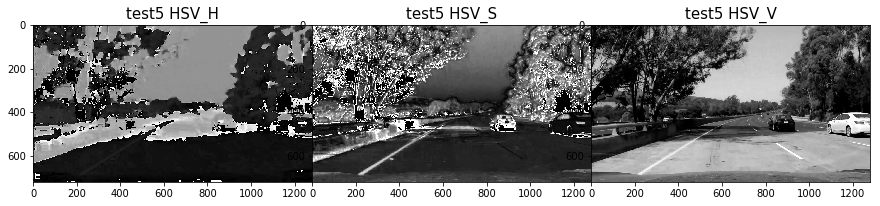

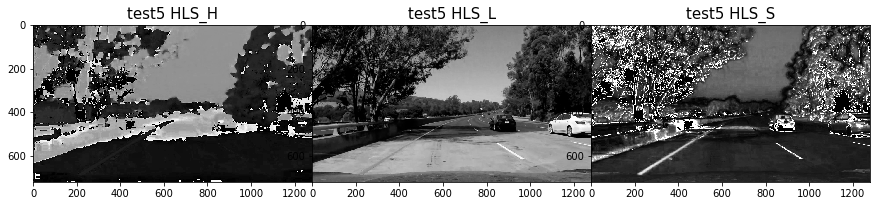

Image: test2
----------------------------------------------------------------


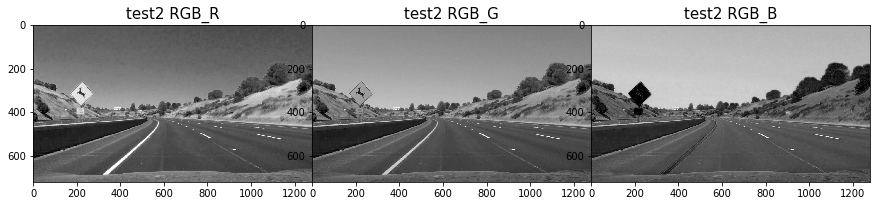

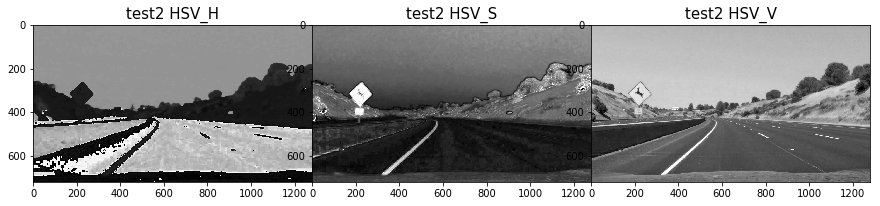

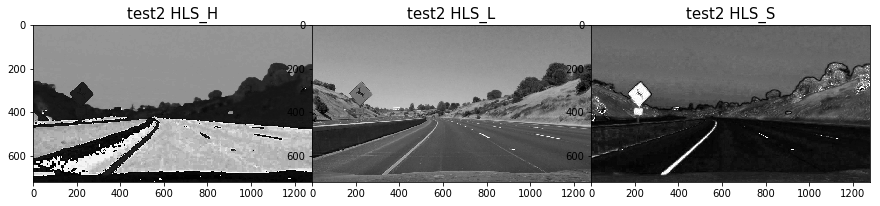

In [10]:
print('Visualizing Image spaces on Test Images...........')
for idx, img in enumerate(test_images): 
    
    image_name = img.split('/')[2].split('.')[0]   
    image = mpimg.imread(img)
    print('Image: {}\n----------------------------------------------------------------'.format(image_name))
    out_dir = os.path.join(TEST_IMAGE_OUT_DIR, image_name)
    # Get RGB
    fig = ip.get_color_channels(image, color_space = 'RGB',  image_name=image_name, plot = True)
    plt.savefig('{}/{}.jpg'.format(out_dir, image_name + '_RGB'))
    # Get HSV
    fig = ip.get_color_channels(image, color_space = 'HSV',  image_name=image_name, plot = True)
    plt.savefig('{}/{}.jpg'.format(out_dir, image_name + '_HSV'))
    # Get HLS
    fig = ip.get_color_channels(image, color_space = 'HLS',  image_name=image_name, plot = True)
    plt.savefig('{}/{}.jpg'.format(out_dir, image_name + '_HLS'))
    plt.show()

#### 2.4 Binary Threshold  Undistorted Images

Applying binary threshold on test images.............
Image: test4
----------------------------------------------------------------


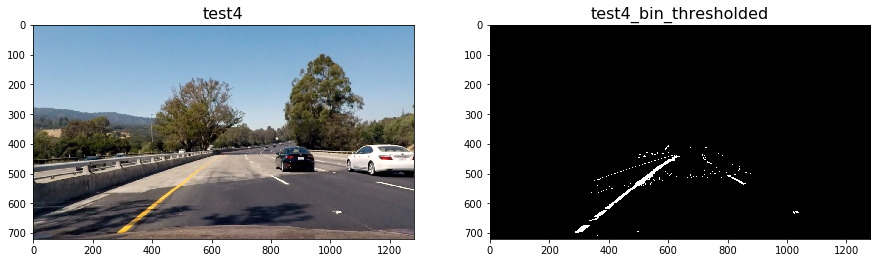

Image: test3
----------------------------------------------------------------


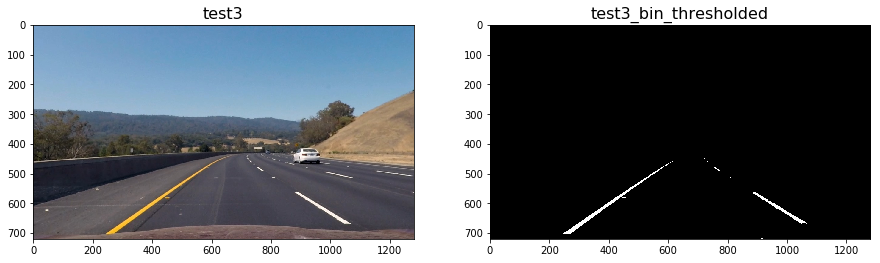

Image: test6
----------------------------------------------------------------


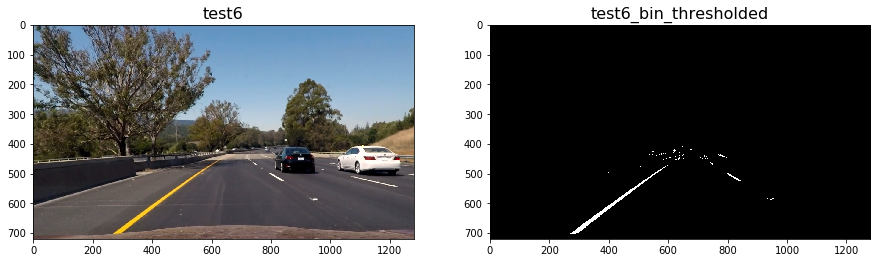

Image: test1
----------------------------------------------------------------


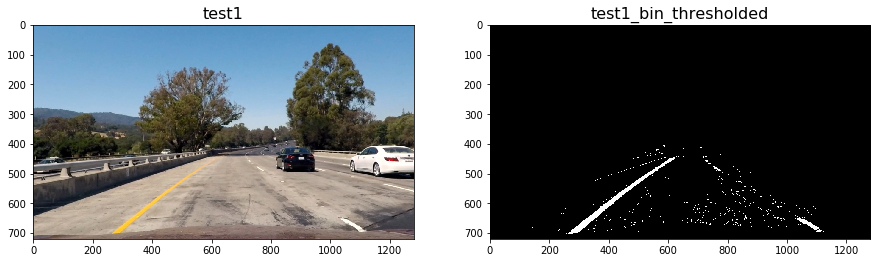

Image: straight_lines1
----------------------------------------------------------------


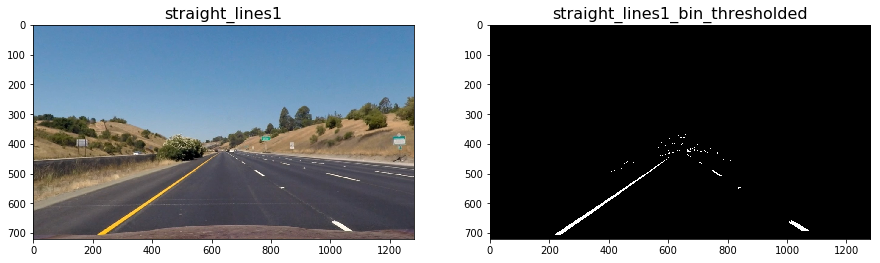

Image: straight_lines2
----------------------------------------------------------------


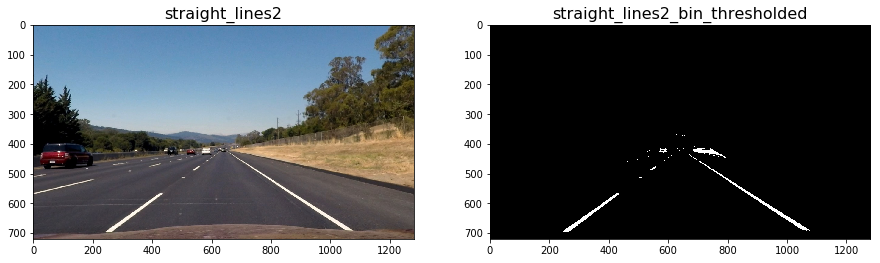

Image: test5
----------------------------------------------------------------


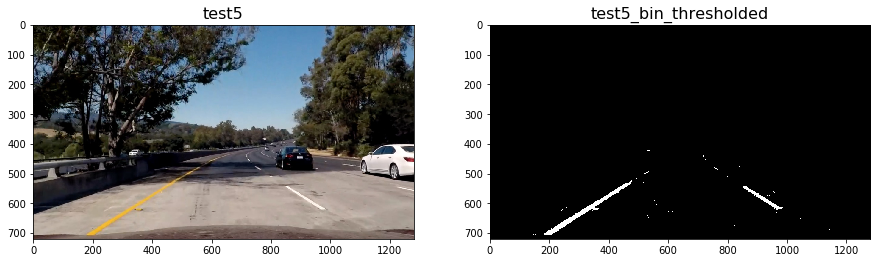

Image: test2
----------------------------------------------------------------


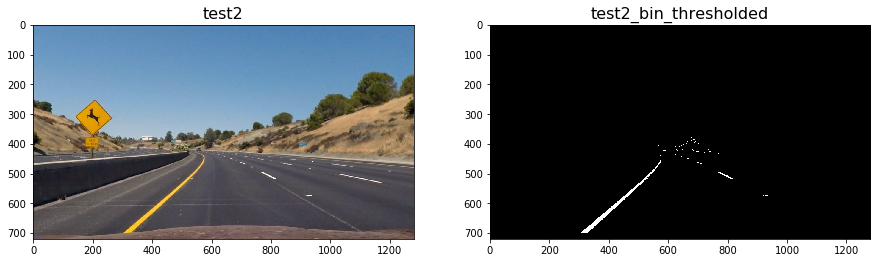

In [11]:
print('Applying binary threshold on test images.............')
for idx, img in enumerate(test_images):    
    image_name = img.split('/')[2].split('.')[0]  
    print('Image: {}\n----------------------------------------------------------------'.format(image_name))
    out_dir = os.path.join(TEST_IMAGE_OUT_DIR, image_name)
    new_image = mpimg.imread(img)
    undist = ip.undistort(new_image, cameraMatrix, distortionCoeffs)
    thresholded = ip.get_binary_thresholded_image(undist, image_name, out_dir)
    plt.show()

#### 2.5 Apply Perspective Transform to get a Bird's Eye View

Applying perspective transform on warped image......
Image: test4
----------------------------------------------------------------


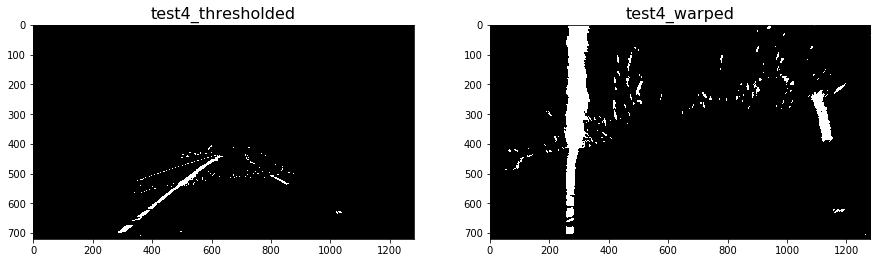

Image: test3
----------------------------------------------------------------


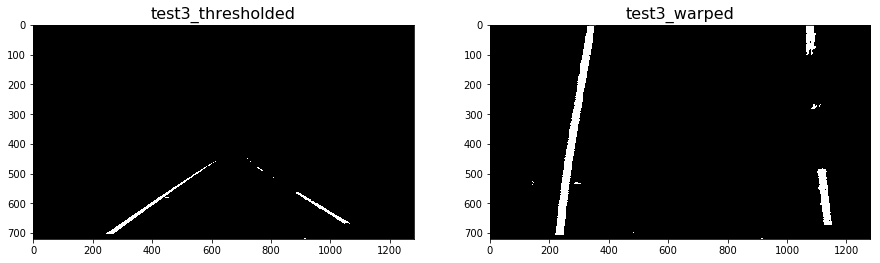

Image: test6
----------------------------------------------------------------


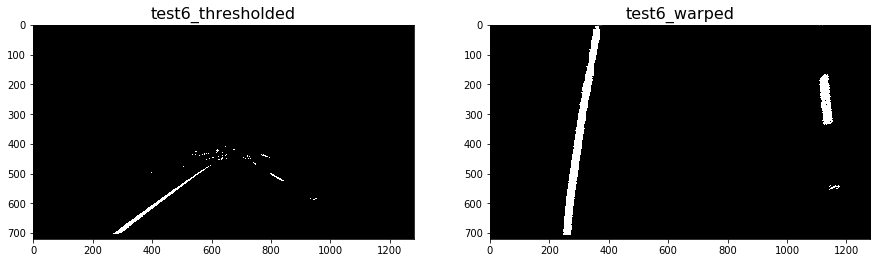

Image: test1
----------------------------------------------------------------


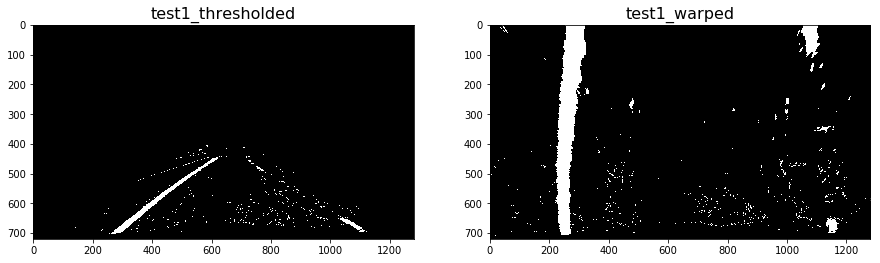

Image: straight_lines1
----------------------------------------------------------------


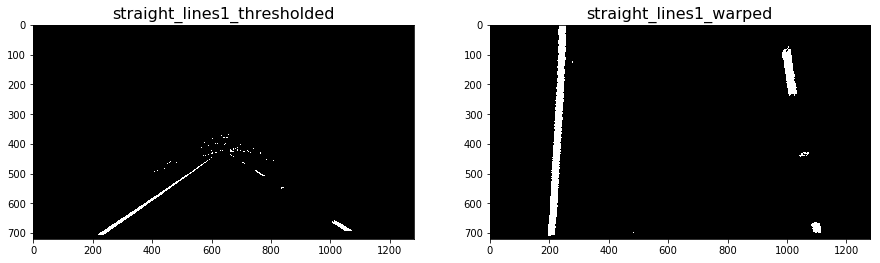

Image: straight_lines2
----------------------------------------------------------------


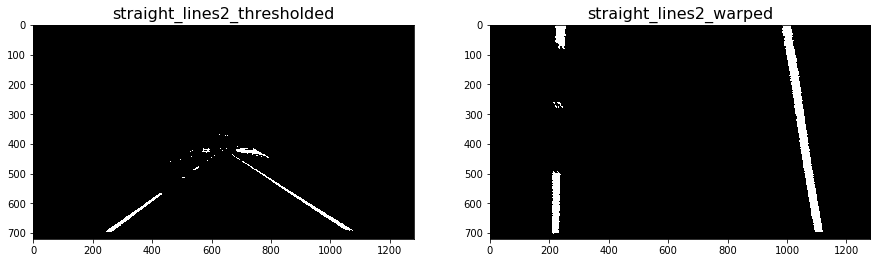

Image: test5
----------------------------------------------------------------


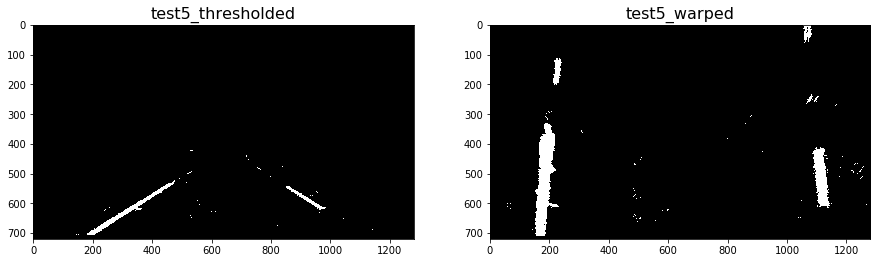

Image: test2
----------------------------------------------------------------


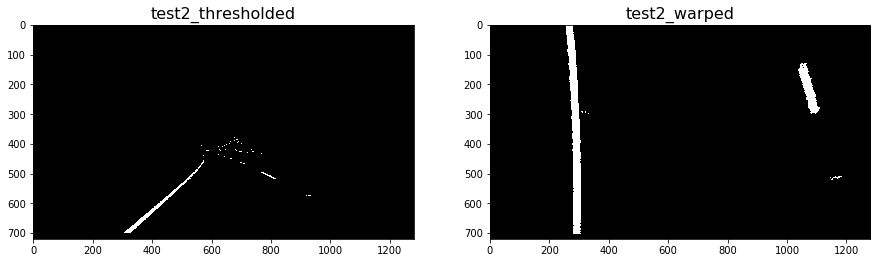

In [12]:
print('Applying perspective transform on warped image......')
for idx, img in enumerate(test_images):    
    image_name = img.split('/')[2].split('.')[0]
    new_image = mpimg.imread(img)
    print('Image: {}\n----------------------------------------------------------------'.format(image_name))
    out_dir = os.path.join(TEST_IMAGE_OUT_DIR, image_name)
    undist = ip.undistort(new_image, cameraMatrix, distortionCoeffs)
    thresholded = ip.get_binary_thresholded_image(undist)
    warped, M_inv = ip.apply_warp(thresholded, image_name, out_dir)
    image_size = (warped.shape[1], warped.shape[0])
    plt.show()

### 3. Try required Lane Detection steps on Images

Image: test4
----------------------------------------------------------------
Pixel histograms of the warped image......


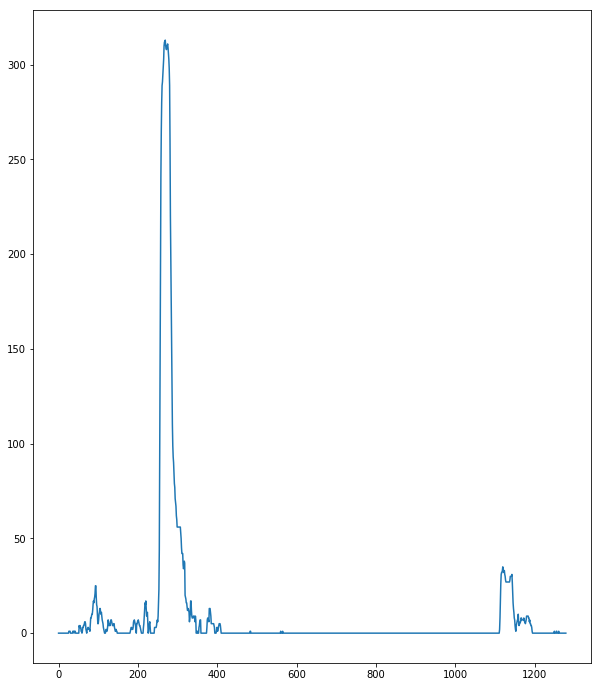

Applying sliding window search for lane detection......


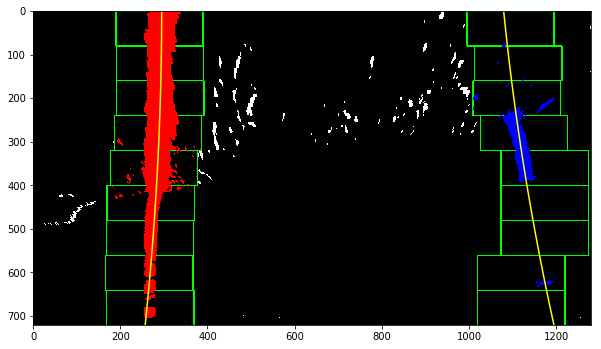

Applying polyfit for lane detection using the information from previous frame.
 In this case from last sliding window search......


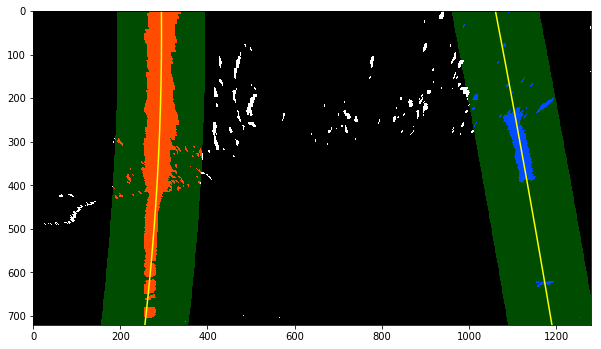

Shaded lane image with distance parameters annotated......


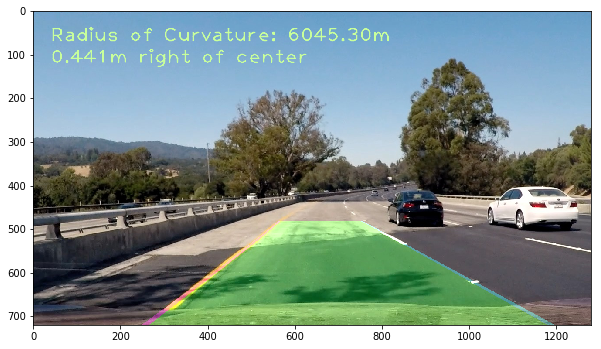

Image: test3
----------------------------------------------------------------
Pixel histograms of the warped image......


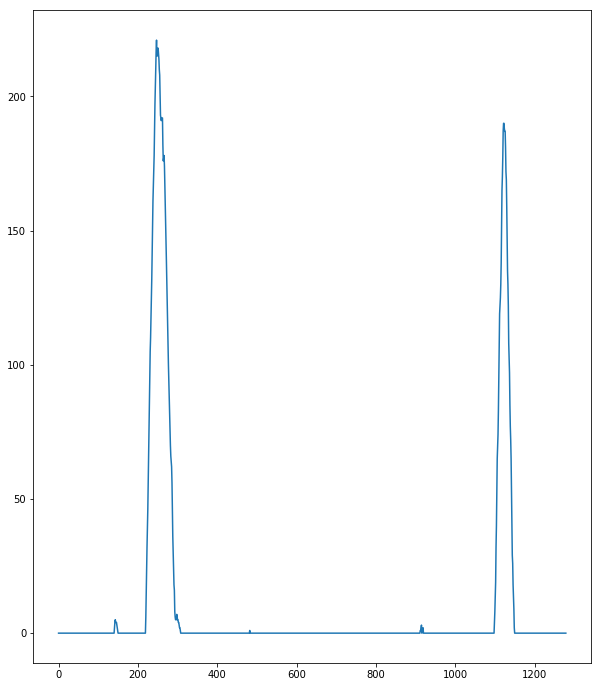

Applying sliding window search for lane detection......


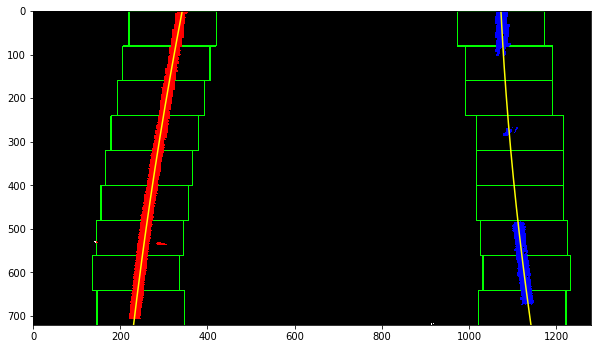

Applying polyfit for lane detection using the information from previous frame.
 In this case from last sliding window search......


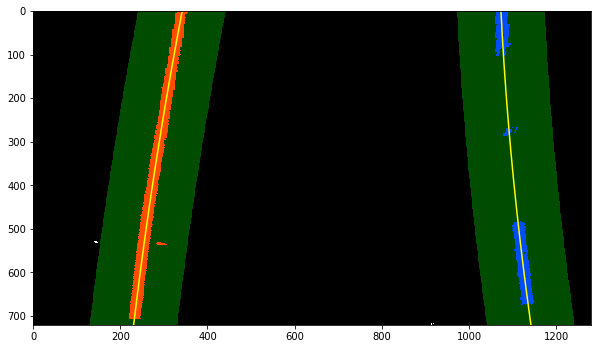

Shaded lane image with distance parameters annotated......


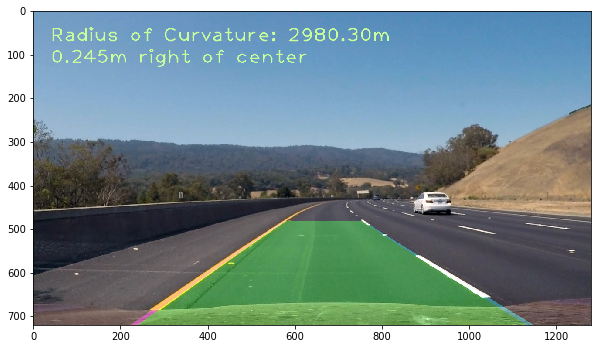

Image: test6
----------------------------------------------------------------
Pixel histograms of the warped image......


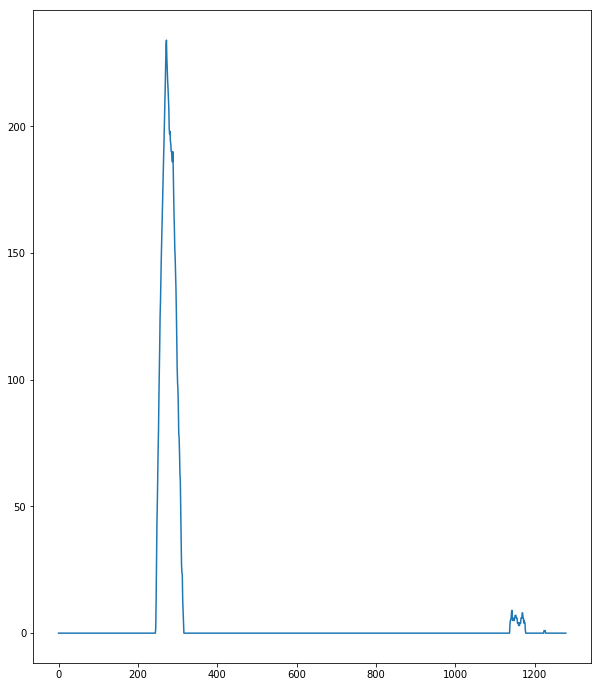

Applying sliding window search for lane detection......


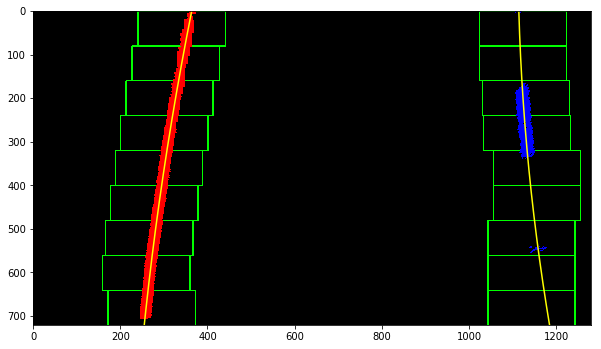

Applying polyfit for lane detection using the information from previous frame.
 In this case from last sliding window search......


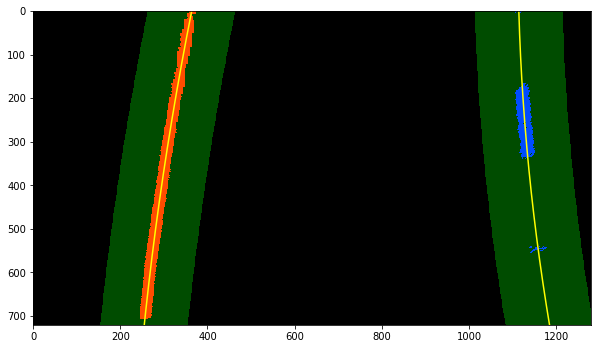

Shaded lane image with distance parameters annotated......


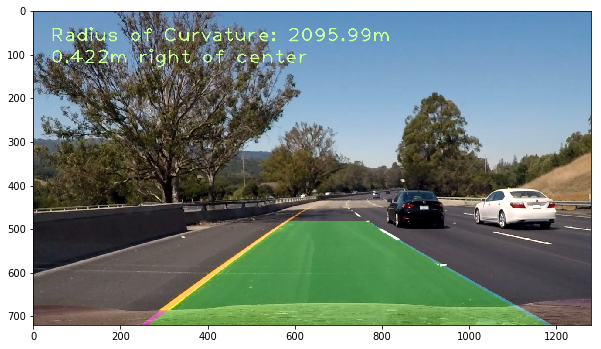

Image: test1
----------------------------------------------------------------
Pixel histograms of the warped image......


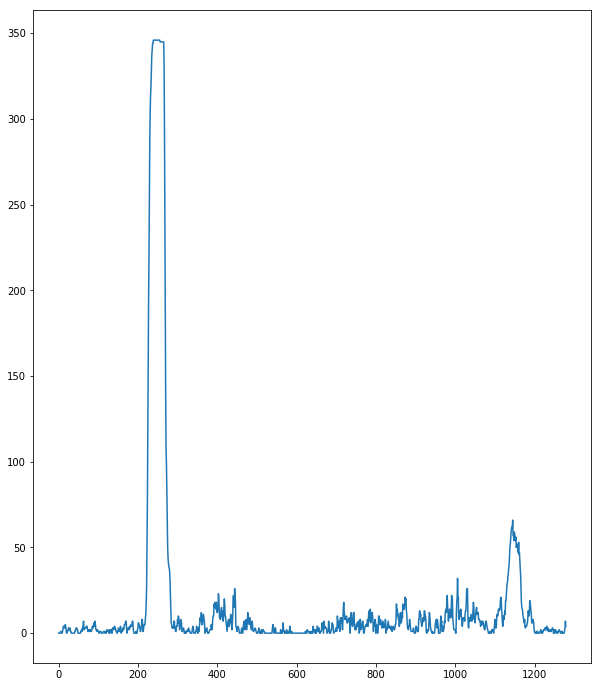

Applying sliding window search for lane detection......


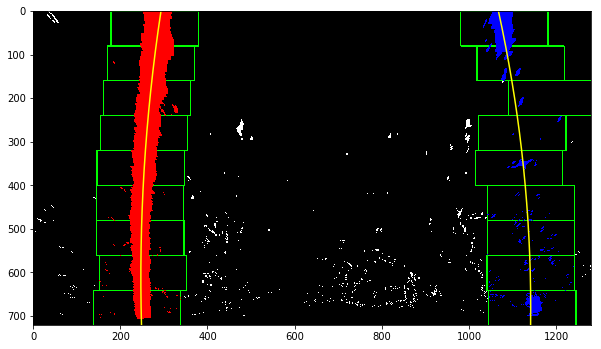

Applying polyfit for lane detection using the information from previous frame.
 In this case from last sliding window search......


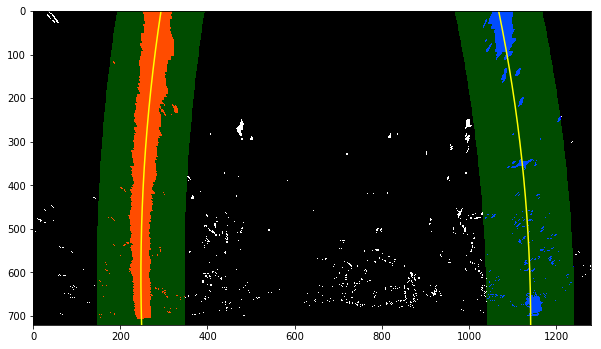

Shaded lane image with distance parameters annotated......


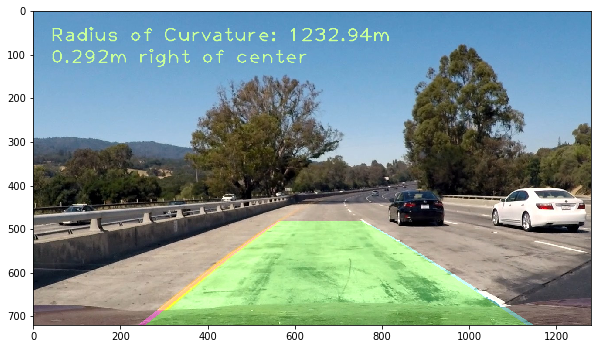

Image: straight_lines1
----------------------------------------------------------------
Pixel histograms of the warped image......


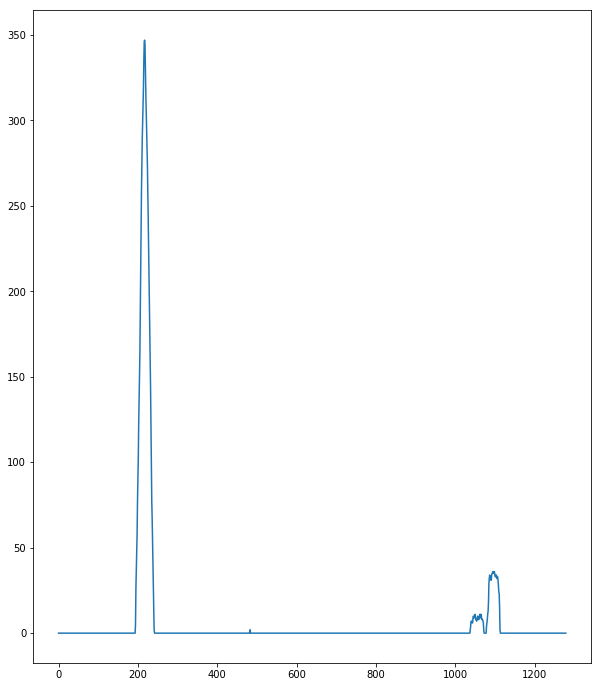

Applying sliding window search for lane detection......


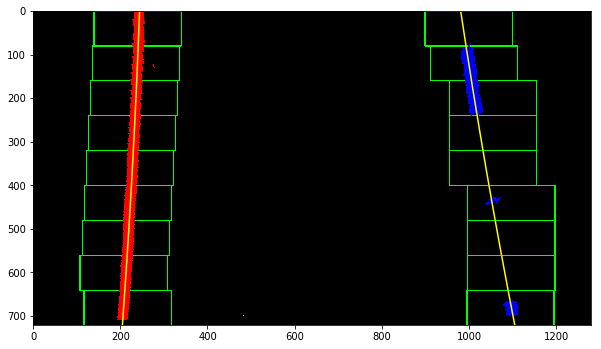

Applying polyfit for lane detection using the information from previous frame.
 In this case from last sliding window search......


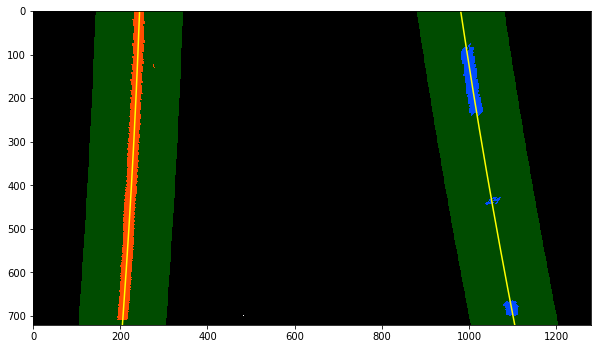

Shaded lane image with distance parameters annotated......


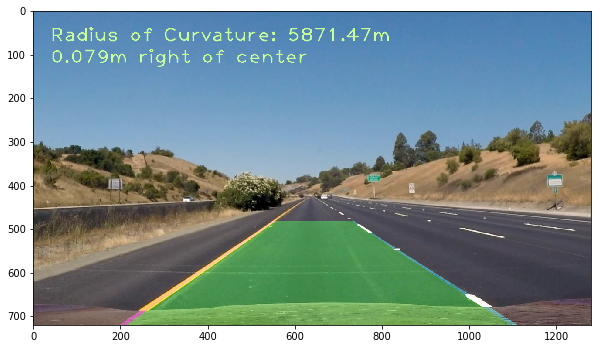

Image: straight_lines2
----------------------------------------------------------------
Pixel histograms of the warped image......


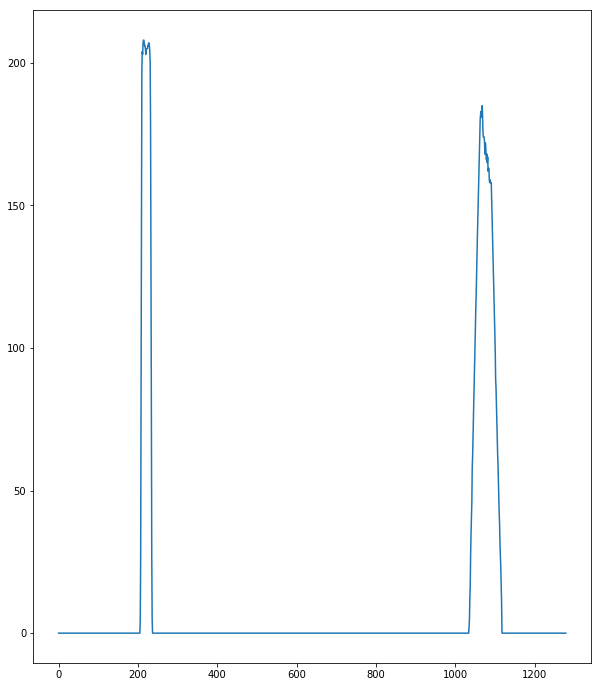

Applying sliding window search for lane detection......


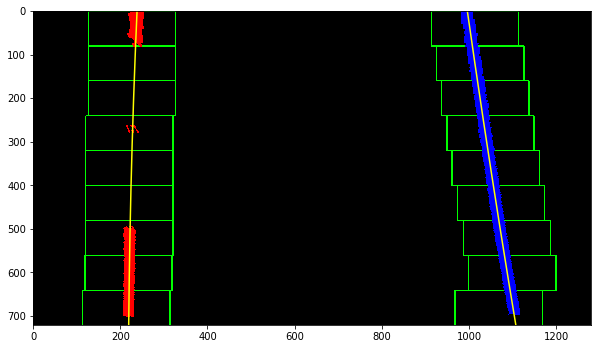

Applying polyfit for lane detection using the information from previous frame.
 In this case from last sliding window search......


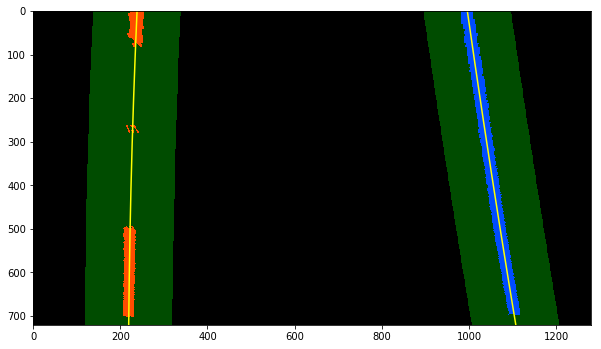

Shaded lane image with distance parameters annotated......


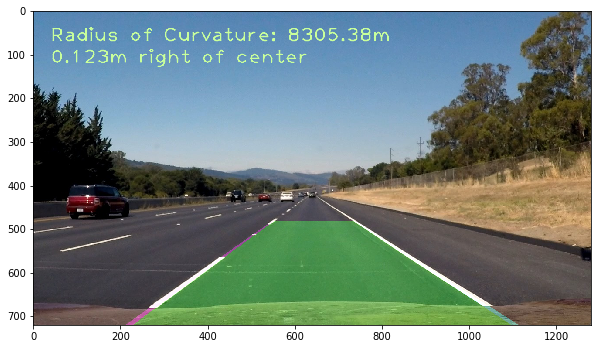

Image: test5
----------------------------------------------------------------
Pixel histograms of the warped image......


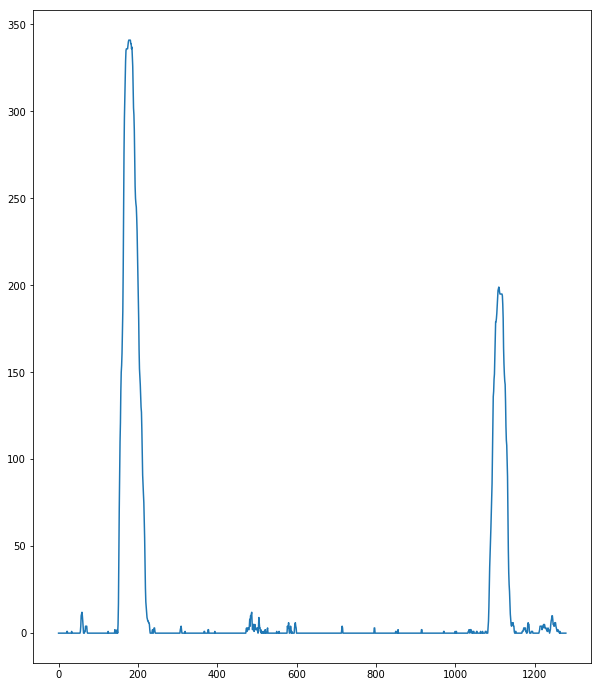

Applying sliding window search for lane detection......


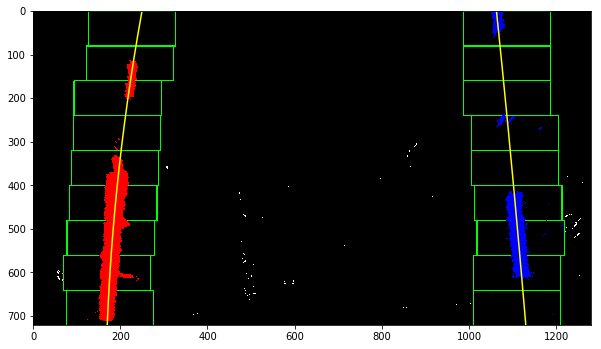

Applying polyfit for lane detection using the information from previous frame.
 In this case from last sliding window search......


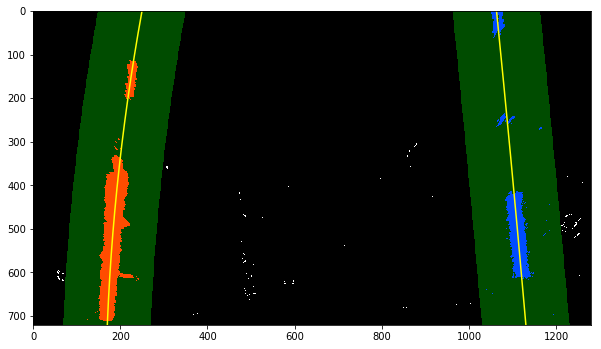

Shaded lane image with distance parameters annotated......


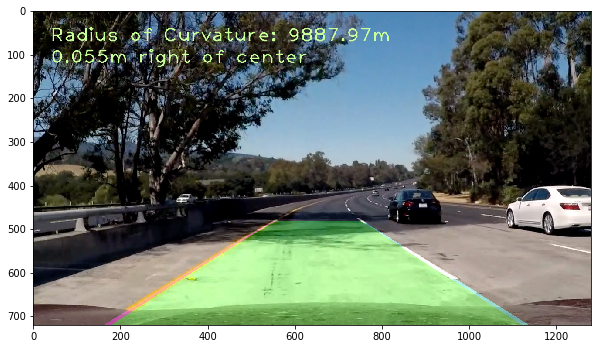

Image: test2
----------------------------------------------------------------
Pixel histograms of the warped image......


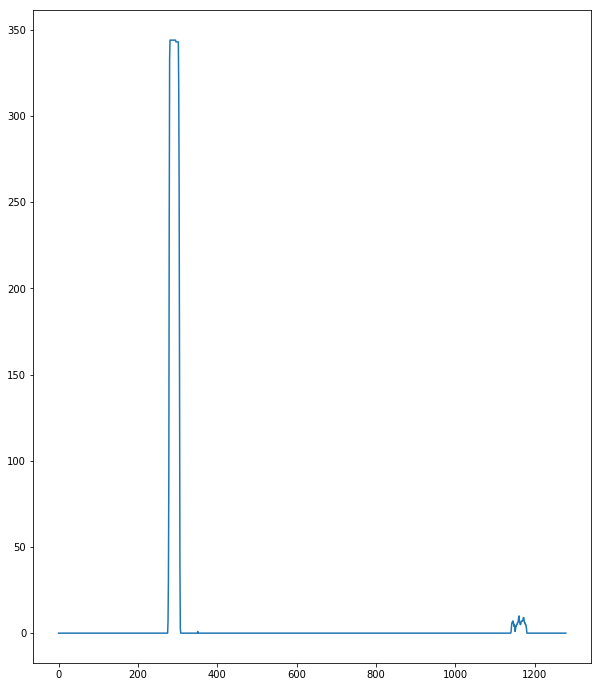

Applying sliding window search for lane detection......


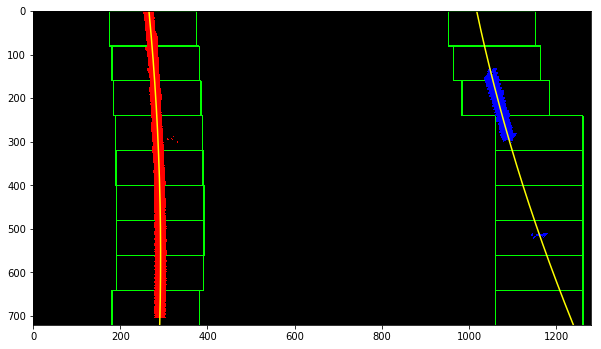

Applying polyfit for lane detection using the information from previous frame.
 In this case from last sliding window search......


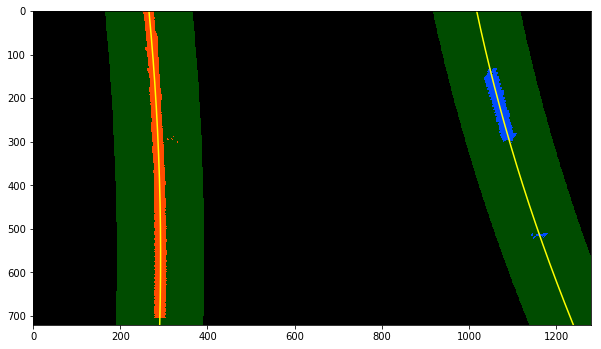

Shaded lane image with distance parameters annotated......


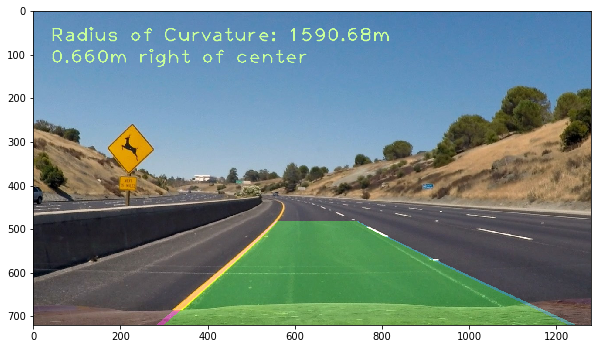

In [13]:
from util import lane_detection as lane_det
test_images = glob.glob('./test_images/*.jpg')

for idx, img in enumerate(test_images):    
    image_name = img.split('/')[2].split('.')[0]
    orig_image = mpimg.imread(img)
    undist = ip.undistort(orig_image,cameraMatrix, distortionCoeffs)
    thresholded = ip.get_binary_thresholded_image(undist)
    warped, M_inv = ip.apply_warp(thresholded)
    image_size = (warped.shape[1], warped.shape[0])
    print('Image: {}\n----------------------------------------------------------------'.format(image_name))
    out_dir = os.path.join(TEST_IMAGE_OUT_DIR, image_name)
    print('Pixel histograms of the warped image......')
    leftx_base, rightx_base = lane_det.plot_histogram(warped, image_name, out_dir) 
    plt.show()
    print('Applying sliding window search for lane detection......')
    left_fit_p, right_fit_p, left_lane_inds, right_lane_inds = lane_det.polyfit_sliding_window(warped, image_name, out_dir) 
    plt.show()
    print('Applying polyfit for lane detection using the information from previous frame.\n In this case from last sliding window search......')
    left_fit_p, right_fit_p, left_lane_inds, right_lane_inds= lane_det.polyfit_using_previous_fit(warped, left_fit_p, right_fit_p, image_name, out_dir) 
    plt.show()
    img_out = lane_det.shade_lane_area(orig_image, warped, left_fit_p, right_fit_p, M_inv, image_name, out_dir)
    curve_rad = lane_det.measure_radius_of_curvature(warped, left_fit_p, right_fit_p, left_lane_inds, right_lane_inds)
    center_offset = lane_det.measure_offset_from_center(warped, left_fit_p, right_fit_p)
    print('Shaded lane image with distance parameters annotated......')
    img_out = lane_det.add_distance_text_to_image(img_out, curve_rad, center_offset, image_name, out_dir)
    plt.imshow(img_out)
    plt.show()